In [48]:
import yaml
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch
import polars as pl

In [49]:
def plot_kuramoto_sivashinsky(data, title, ax):
    num_time_steps = data.shape[0]
    num_spatial_points = data.shape[1]
    t_start = 0
    t_end = int(num_time_steps * 0.2)
    x_start = 0
    x_end = num_spatial_points
    t_eval = np.linspace(t_start, t_end, num_time_steps)
    x = np.linspace(x_start, x_end, num_spatial_points)
    T, X = np.meshgrid(t_eval, x)
    
    contourf = ax.contourf(T, X, data.T, 100, cmap='plasma')
    plt.colorbar(contourf, ax=ax)
    contours = ax.contour(T, X, data.T, 10, colors='black')
    ax.clabel(contours, inline=True, fontsize=8)
    ax.set_title(title)
    ax.set_xlabel('Time (in seconds)')
    ax.set_ylabel('Spatial Dimension')

In [50]:
def plot_comparison(truth, predict):
    diff = np.abs(truth - predict)
    fig, axs = plt.subplots(1, 3, figsize=(45, 15), dpi=100)
    plot_kuramoto_sivashinsky(truth, 'Ground Truth', axs[0])
    plot_kuramoto_sivashinsky(predict, 'Prediction', axs[1])
    plot_kuramoto_sivashinsky(diff, 'Difference (Absolute)', axs[2])
    plt.tight_layout()
    plt.show()

In [74]:
def plot_corrs(corrs):
    time_steps = range(len(corrs))
    plt.figure(figsize=(10, 6))
    plt.plot(time_steps, corrs, label='Correlation Over Time')
    plt.xlabel('Time Step')
    plt.ylabel('Correlation Coefficient')
    plt.title('Average Correlation Between Actual and Predicted Trajectories')
    plt.legend()
    plt.grid(True)
    plt.show()

In [75]:
all_corrs = []
for i in range(32):
    u, _, cond, _ = torch.load(f"/Users/davidwagner/pde_data/data/test/{i}.pth")
    predict = torch.load(f"/Users/davidwagner/pde_data/data/test/{i}_predict.pth")
    corrs = []
    for a, b in zip(u[0, :, 0, :], predict):
        corr = np.corrcoef(a, b)[0, 1]
        corrs.append(corr)
    corrs = pl.DataFrame(corrs)
    all_corrs.append(corrs)
    # plot_comparison(u[0, :, 0, :], predict)

In [76]:
corrs = (
    pl.concat([df.rename({"column_0": f"{i}"}) for i, df in enumerate(all_corrs)], how="horizontal")
    .select(pl.mean_horizontal("*"))
)

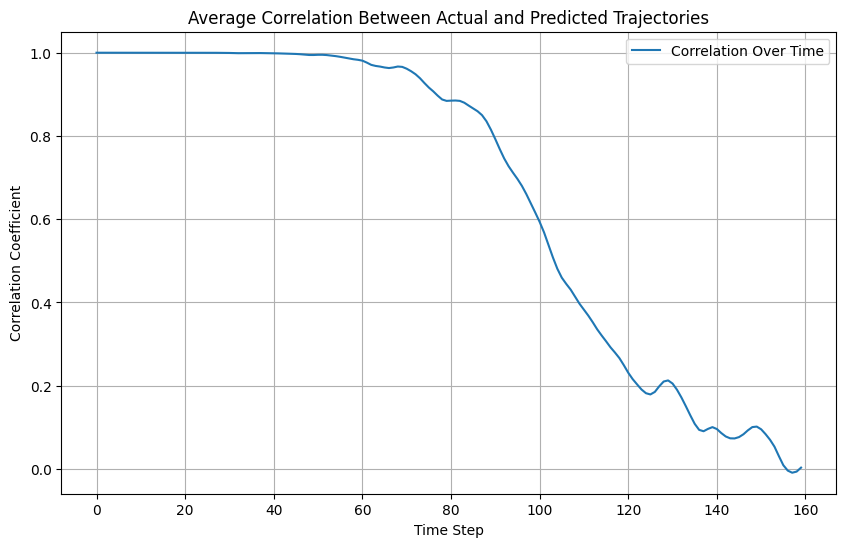

In [77]:
plot_corrs(corrs)

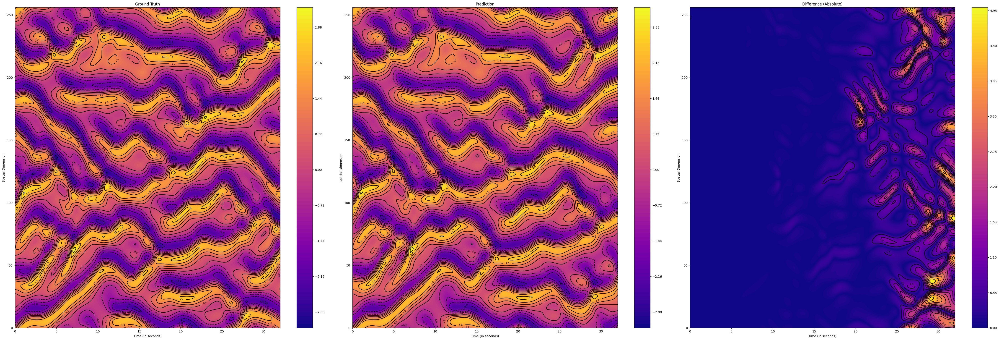

In [68]:
for i in range(1):
    u, _, cond, _ = torch.load(f"/Users/davidwagner/pde_data/data/test/{i}.pth")
    predict = torch.load(f"/Users/davidwagner/pde_data/data/test/{i}_predict.pth")
    plot_comparison(u[0, :, 0, :], predict)

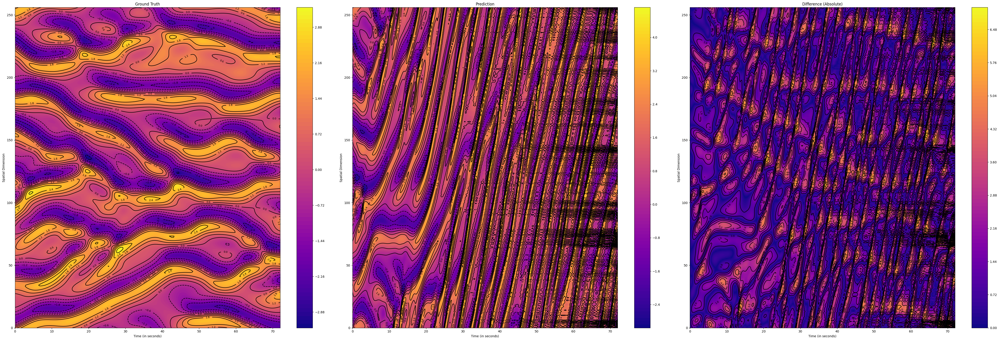

In [23]:
for i in range(1):
    l = 360
    u, cond = torch.load(f"/Users/davidwagner/pde_data/data/test_long/{i}.pth")
    predict = torch.load(f"/Users/davidwagner/pde_data/data/test_long/{i}_predict.pth")
    plot_comparison(u[:l], predict[:l])